Name: Kinshuk Srivastava (SVNIT Surat)

In [1]:
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms
import mpl_toolkits.mplot3d.art3d as art3d
from scipy.stats import multivariate_normal, norm
from matplotlib import cm
import scipy.stats as stats
from matplotlib.animation import FuncAnimation
import seaborn as sns
from IPython.display import HTML,Image # needed to watch the animations in jupyter notebook 
import pandas as pd
import matplotlib.image as mpimg

In [ ]:
# https://gist.github.com/CarstenSchelp/b992645537660bda692f218b562d0712 - using this as basis however made a slight modification towards the end to suit my needs(3D plotting instead of 2D)
def confidence_ellipse(x, y, ax, n_std=3.0, facecolor='none', **kwargs):
    """
    Create a plot of the covariance confidence ellipse of `x` and `y`
    
    See how and why this works: https://carstenschelp.github.io/2018/09/14/Plot_Confidence_Ellipse_001.html
    
    This function has made it into the matplotlib examples collection:
    https://matplotlib.org/devdocs/gallery/statistics/confidence_ellipse.html#sphx-glr-gallery-statistics-confidence-ellipse-py
    
    Or, once matplotlib 3.1 has been released:
    https://matplotlib.org/gallery/index.html#statistics
    
    I update this gist according to the version there, because thanks to the matplotlib community
    the code has improved quite a bit.
    Parameters
    ----------
    x, y : array_like, shape (n, )
        Input data.
    ax : matplotlib.axes.Axes
        The axes object to draw the ellipse into.
    n_std : float
        The number of standard deviations to determine the ellipse's radiuses.
    Returns
    -------
    matplotlib.patches.Ellipse
    Other parameters
    ----------------
    kwargs : `~matplotlib.patches.Patch` properties
    """
    if x.size != y.size:
        raise ValueError("x and y must be the same size")

    cov = np.cov(x, y)
    pearson = cov[0, 1]/np.sqrt(cov[0, 0] * cov[1, 1])
    # Using a special case to obtain the eigenvalues of this
    # two-dimensionl dataset.
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    
    # Calculating the stdandard deviation of x from
    # the squareroot of the variance and multiplying
    # with the given number of standard deviations.
    scale_x = np.sqrt(cov[0, 0]) * n_std
    mean_x = np.mean(x)

    # calculating the stdandard deviation of y ...
    scale_y = np.sqrt(cov[1, 1]) * n_std
    mean_y = np.mean(y)
    ellipse = Ellipse((mean_x, mean_y),
        width=ell_radius_x * 2 * scale_x,
        height=ell_radius_y * 2 * scale_y,
        facecolor=facecolor,
        **kwargs)
    #got rid of 2D affine transformation part and used the ellipse object as it is
    return ellipse

***partA_plotter(i) -***
    takes an integer as input, which is used to access pre-generated per frame data using ***frames_gen(frame_count)***

In [ ]:
def partA_plotter(i):
    fig.clf() #clear last frame
    part = loop
    ax = fig.add_subplot(projection='3d')
    if part == 1: # for varying only the mean
        mu_x = mean_frames[i,0]
        mu_y = mean_frames[i,1]
        variance_x = 1
        variance_y = 1
        a,b = np.random.default_rng().multivariate_normal([mu_x, mu_y], [[variance_x, 0], [0, variance_y]], 1000).T
    elif part == 2: #for varying individual variance
        mu_x = 0
        mu_y = 0
        variance_x = variance_vary_frames[i,0,0]
        variance_y = variance_vary_frames[i,1,1]
        a,b = np.random.default_rng().multivariate_normal([mu_x, mu_y], [[variance_x, 0], [0, variance_y]], 1000).T
    else: # for varying covariance
        mu_x = 0
        mu_y = 0
        variance_x = cov_vary_frames[i,0,0]
        variance_y = cov_vary_frames[i,1,1]
        a,b = np.random.default_rng().multivariate_normal([mu_x, mu_y], cov_vary_frames[i], 1000).T
    
    ax.scatter(a,b,edgecolors = 'black')
    #for plotting the distribution
    kdea = stats.gaussian_kde(a)
    kdeb = stats.gaussian_kde(b)
    
    ep = confidence_ellipse(a,b,ax,edgecolor = 'red')
    ax.add_patch(ep)
    #3 sigma ellipse plot
    art3d.pathpatch_2d_to_3d(ep, z=0, zdir='z')
    ax.plot(x, kdea(x), zs=0, zdir='y')
    ax.plot(y,kdeb(y),zs = 0,zdir = 'x')
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.set_title('mean x = %2.3f, mean y = %2.3f, variance x = %2.3f, variance y = %2.3f' % (mu_x,mu_y,variance_x,variance_y))
    plt.show()
    return

In [ ]:
def frames_gen(frame_count = 20):
    mean_frames = np.zeros((frame_count,2)) #since we are animating bivariate distribution
    variance_vary_frames = np.zeros((frame_count,2,2))
    cov_vary_frames = np.zeros((frame_count,2,2))
    x = np.linspace(-20,20,1000)
    y = np.linspace(-20,20,1000)
    #creating 2D mesh for the plot
    X, Y = np.meshgrid(x,y)
    for i in range(frame_count):
        mean_frames[i,1] = i
        variance_vary_frames[i,0,0] = i + 1
        variance_vary_frames[i,1,1] = 1
        cov_vary_frames[i] = np.random.randint(10,size = (2,2))
        cov_vary_frames[i,0,1] = 0 
        cov_vary_frames[i,1,0] = 0
        #to ensure that covariance mtrix is positive definite 
        if cov_vary_frames[i,0,0] == 0:
            cov_vary_frames[i,0,0] = 1
        if cov_vary_frames[i,1,1] == 0:
            cov_vary_frames[i,1,1] = 1
        
    return mean_frames,variance_vary_frames, cov_vary_frames,x,y

In [ ]:
mean_frames,variance_vary_frames,cov_vary_frames,x,y = frames_gen()

In [ ]:
cov_vary_frames

In [ ]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')

In [ ]:
loop = 1
anim = FuncAnimation(fig,func = partA_plotter,frames = 20,interval = 300,blit = False)
HTML(anim.to_jshtml())
    

In [ ]:
anim.save('/kaggle/working/animation1.gif', writer='imagemagick', fps=5)

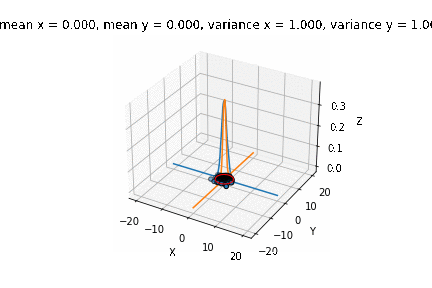

In [2]:
Image('/kaggle/working/animation1.gif')

In [ ]:
loop = 2
anim = FuncAnimation(fig,func = partA_plotter,frames = 20,interval = 300,blit = False)
HTML(anim.to_jshtml())


In [ ]:
anim.save('/kaggle/working/animation2.gif', writer='imagemagick', fps=5)

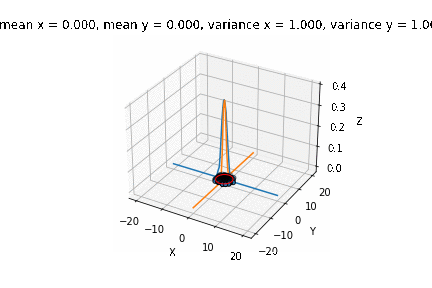

In [3]:
Image('/kaggle/working/animation2.gif')

In [ ]:
loop = 3
anim = FuncAnimation(fig,func = partA_plotter,frames = 20,interval = 300,blit = False)
HTML(anim.to_jshtml())
    

In [ ]:
anim.save('/kaggle/working/animation3.gif', writer='imagemagick', fps=5)

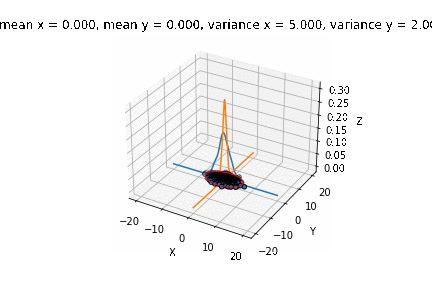

In [4]:
Image('/kaggle/working/animation3.gif')

In [ ]:
#sampliing via cholesky decomposition of covariance matrix,used for part 2
def multivariate_dist_sample_gen(dimensions,samples_req):
    mean_mat = np.zeros((dimensions,1))
    cov_mat = np.zeros((dimensions,dimensions))
    for loop in range(0,dimensions):
        mean_mat[loop] = np.random.randint(10,size = 1)
        cov_mat[loop,loop] = np.random.randint(10,size = 1) + 1 #creating a diagonal covariance matrix
    b = np.linalg.cholesky(cov_mat)
    samples = np.random.normal(0,1,size = (dimensions,samples_req))
    result = mean_mat + np.matmul(b,samples)
    return result,mean_mat,cov_mat

In [ ]:
#part 2 and 3
result,mu_out,cov_out = multivariate_dist_sample_gen(5,10000)
print("Expected mean -  ",'\n',mu_out,'\nExpected covariance matrix - \n',cov_out)
mu_res = np.zeros((result.shape[0],1))
var_res = np.zeros((result.shape[0],1))
for i in range(result.shape[0]):
    mu_res[i] = np.mean(result[i,:])
    var_res[i] = np.var(result[i,:])
cov_out = np.cov(result)
print("Actual Mean -",'\n',mu_res,'\nActual variance -\n',var_res,'\nActual covariance matrix -\n',cov_out)

In [ ]:
#squared_exponential_kernel for part 4 and 5
def squared_exponential_kernel(x,x_dash,scale):
    res = np.exp((-0.5*(1/(scale**2)))*np.square(np.linalg.norm(x-x_dash)))
    return res

In [ ]:
#this snippet of code demonstrates how I have generated covariance matrix using kernels 
eq_spaced_in = np.linspace(-10,10,num = 100)
cov_mat_res = np.zeros((100,100))
for i in range(100):
    for j in range(100):
        cov_mat_res[i,j] = squared_exponential_kernel(eq_spaced_in[i],eq_spaced_in[j],0.25)


In [ ]:
plt.imshow(cov_mat_res)

In [ ]:
def animate_sq_expo(scale):
    eq_spaced_in = np.linspace(-10,10,num = 100)
    cov_mat_res = np.zeros((100,100))
    fig.clf()
    ax = fig.add_subplot()
    for i in range(100):
        for j in range(100):
            cov_mat_res[i,j] = squared_exponential_kernel(eq_spaced_in[i],eq_spaced_in[j],scale + 1)
    pos = ax.imshow(cov_mat_res)
    fig.colorbar(pos,ax = ax)
    ax.set_title("scale = %d" % (scale + 1))

In [ ]:
fig = plt.figure()
anim = FuncAnimation(fig,func = animate_sq_expo,frames = 20,interval = 300,blit = False)
HTML(anim.to_jshtml())
    

In [ ]:
anim.save('/kaggle/working/animation4.gif', writer='imagemagick', fps=5)

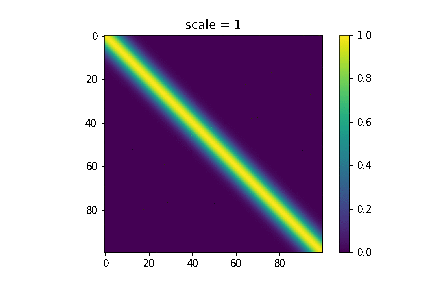

In [5]:
Image('/kaggle/working/animation4.gif')

In [ ]:
#rational quadratic kernel, 2nd kernel for part 4 and 5
def rational_quadratic_kernel(x,x_dash,scale,alpha):
    factor = np.square(np.linalg.norm(x-x_dash))/(2*alpha*(scale*scale)) 
    factor = factor + 1
    res = np.power(factor,(-alpha))
    return res

In [ ]:
def animate_rational_quadratic_kernel(alpha):
    eq_spaced_in = np.linspace(-10,10,num = 100)
    cov_mat_res = np.zeros((100,100))
    scale = 2
    fig.clf()
    ax = fig.add_subplot()
    for i in range(100):
        for j in range(100):
            cov_mat_res[i,j] = rational_quadratic_kernel(eq_spaced_in[i],eq_spaced_in[j],scale,(alpha+1)/100)
    pos = ax.imshow(cov_mat_res)
    fig.colorbar(pos,ax = ax)
    ax.set_title("scale = 2, alpha = %1.3f" % ((alpha + 1)/100))

In [ ]:
fig = plt.figure()
anim = FuncAnimation(fig,func = animate_rational_quadratic_kernel,frames = 200,interval = 300,blit = False)
HTML(anim.to_jshtml())

In [ ]:
anim.save('/kaggle/working/animation5.gif', writer='imagemagick', fps=30)

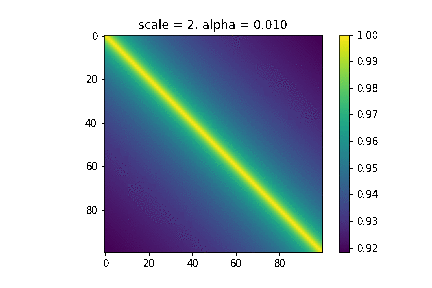

In [6]:
Image('/kaggle/working/animation5.gif')

In [ ]:
#third and final kernel for part 4 and 5
def periodic_kernel(x,x_dash,scale,period):
    factor = 2*np.square(np.sin((np.pi)*np.linalg.norm(x-x_dash)/period))/(scale*scale)
    res = np.exp(-factor)
    return res

In [ ]:
def animate_periodic_kernel(period):
    eq_spaced_in = np.linspace(-10,10,num = 100)
    cov_mat_res = np.zeros((100,100))
    scale = 2
    fig.clf()
    ax = fig.add_subplot()
    for i in range(100):
        for j in range(100):
            cov_mat_res[i,j] = periodic_kernel(eq_spaced_in[i],eq_spaced_in[j],scale,period + 1)
    pos = ax.imshow(cov_mat_res)
    fig.colorbar(pos,ax = ax)
    ax.set_title("scale = 2, period = %d" % ((period + 1)))

In [ ]:
fig = plt.figure()
anim = FuncAnimation(fig,func = animate_periodic_kernel,frames = 99,interval = 300,blit = False)
HTML(anim.to_jshtml())

In [ ]:
anim.save('/kaggle/working/animation6.gif', writer='imagemagick', fps=30)

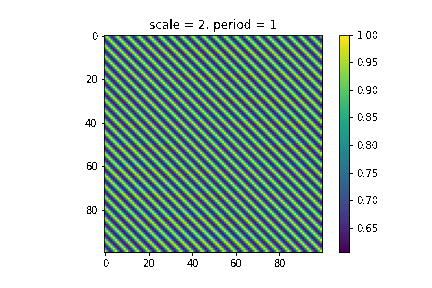

In [7]:
Image('/kaggle/working/animation6.gif')

In [ ]:
def part_6(scale):
    #scale to vary squared exponential kernel every frame
    dimensions = 10
    eq_spaced_in = np.linspace(-10,10,num = dimensions)
    cov_mat_res = np.zeros((dimensions,dimensions))
    fig.clf()
    ax1 = fig.add_subplot(1,2,1)
    ax2 = fig.add_subplot(1,2,2)
    for i in range(dimensions):
        for j in range(dimensions):
            cov_mat_res[i,j] = squared_exponential_kernel(eq_spaced_in[i],eq_spaced_in[j],0.5*scale + 1)
    pos = ax1.imshow(cov_mat_res)
    ax1.set_title("scale = %1.3f" % (0.5*scale + 1))
    fig.colorbar(pos,ax = ax1)
    mean_vec = np.zeros((dimensions,))
    #drawing 20 samples using inbuilt function
    samples = np.random.default_rng().multivariate_normal(mean_vec,cov_mat_res, 20).T
    for i in range(samples.shape[1]):
        ax2.scatter(eq_spaced_in,samples[:,i])
    ax2.set_title("20 samples drawn")

In [ ]:
fig = plt.figure()
anim = FuncAnimation(fig,func = part_6,frames = 200,interval = 300,blit = False)
HTML(anim.to_jshtml())

In [ ]:
anim.save('/kaggle/working/animation7.gif', writer='imagemagick', fps=20)

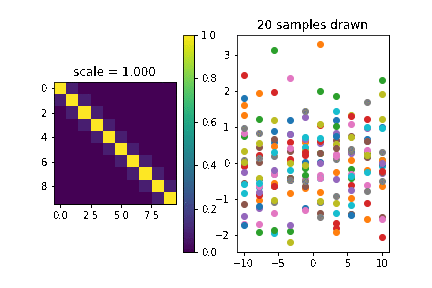

In [8]:
Image('/kaggle/working/animation7.gif')

In [ ]:
def part_7(dimensions,partition_len):
    #partition_len used to fix the number of points as independent 
    mean = np.zeros((dimensions,1))
    eq_spaced_in = np.linspace(-10,10,num = dimensions)
    cov_mat_res = np.zeros((dimensions,dimensions))
    for i in range(dimensions):
        for j in range(dimensions):
            cov_mat_res[i,j] = squared_exponential_kernel(eq_spaced_in[i],eq_spaced_in[j],2)
    #segmenting mean vector and covariance matrix into two halves 
    c11 = cov_mat_res[0:partition_len,0:partition_len]
    c12 = cov_mat_res[0:partition_len,partition_len:dimensions]
    c21 = cov_mat_res[partition_len:dimensions,0:partition_len]
    c22 = cov_mat_res[partition_len:dimensions,partition_len:dimensions]
    m1 = mean[0:partition_len]
    m2 = mean[partition_len:dimensions]
    m2_dim_change = m2.reshape((m2.shape[0],))
    conditional_data = np.reshape(np.sin(x[partition_len:dimensions]),(2,1))
    conditional_mu = m1 + c12.dot(np.linalg.inv(c22)).dot((conditional_data - m2)) #conditional mean obtained
    conditional_cov = np.linalg.inv(np.linalg.inv(cov_mat_res)[0:partition_len, 0:partition_len]) #conditional covariance obtained
    dependent_data = np.random.multivariate_normal(conditional_mu[:,0], conditional_cov, 1).T #sample drawn from conditional distribution
    print("mean of the conditional distribution -\n",conditional_mu,"\ncovariance matrix of the conditional matrix -\n",conditional_cov)
    fig = plt.figure()
    ax1 = fig.add_subplot(1,2,1)
    ax2 = fig.add_subplot(1,2,2)
    ax1.set_title("unconditional distribution covariance matrix")
    ax2.set_title("conditional distribution covariance matrix")
    ax1.imshow(cov_mat_res)
    ax2.imshow(conditional_cov)
    fig.savefig('/kaggle/working/part7.png')
    plt.show()
    return cov_mat_res,dependent_data,conditional_data,conditional_mu

In [ ]:
x1,x2,x3,x4 = part_7(10,8)

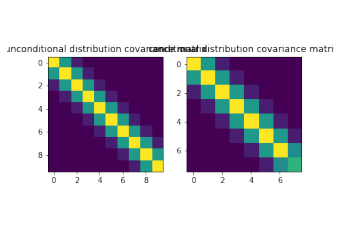

In [9]:

pl = plt.imread('/kaggle/working/part7.png')
plt.imshow(pl)
plt.axis('off')
plt.show()

In [ ]:
def part8(n_points,other_samples,test_num):
    #for this part I have fixed (xi,yi) pairs generated from np.sin() function to generate conditional distribution 
    x = np.linspace(0,2*np.pi,n_points)
    y = np.sin(x)
    cov_mat = np.zeros((n_points,n_points))
    for i in range(n_points):
        for j in range(n_points):
            cov_mat[i,j] = squared_exponential_kernel(x[i],x[j],0.5)
    other_points = np.linspace(-0.5,2*np.pi + 0.5,num = other_samples) #for other samples not in the original pool and will be sampled from conditional distribution
    cov_others = np.zeros((other_samples,other_samples))
    for i in range(other_samples):
        for j in range(other_samples):
            cov_others[i,j] = squared_exponential_kernel(other_points[i],other_points[j],0.5)
    cov_mat_others = np.zeros((other_samples,n_points))
    for i in range(other_samples):
        for j in range(n_points):
            cov_mat_others[i,j] = squared_exponential_kernel(other_points[i],x[j],0.5)
    #inverse of required in finding conditional distribution parameters
    cov_mat_inv = np.linalg.inv(cov_mat)
    mean_pred = np.matmul(np.matmul(cov_mat_others,cov_mat_inv),y) #updating other point mean vec in accordance to our fixed set of data
    cov_pred = cov_others  - np.matmul(cov_mat_others,np.matmul(cov_mat_inv,cov_mat_others.T))#updating the covariance matrix 
    new_samples = np.random.multivariate_normal(mean_pred,cov_pred,test_num).T #get new samples from conditional distribution
    y_error = 2*np.diag(cov_pred) # 2 sigma limit for 95% confidence level
    mean_vec = np.zeros((other_samples,1))
    for i in range(other_samples):
        mean_vec[i] = np.mean(new_samples[i,:])
    fig1 = plt.figure()
    ax = fig1.add_subplot(1,1,1)
    for i in range(test_num):
        ax.scatter(other_points,new_samples[:,i],color = 'gray',alpha = 0.3)
    ax.errorbar(other_points,mean_vec,yerr = y_error,linestyle = '--',alpha = 0.5,color = 'red')
    ax.plot(other_points,np.sin(other_points),color = 'yellow',alpha = 0.7)
    ax.scatter(x,y,linewidths = 3,color = 'black')
    fig2 = plt.figure()
    ax1 = fig2.add_subplot(1,2,1)
    ax1.set_title("unconditional covariance matrix")
    ax2 = fig2.add_subplot(1,2,2)
    ax2.set_title("conditional covariance matrix")
    ax1.imshow(cov_others)
    ax2.imshow(cov_pred)
    fig1.savefig('/kaggle/working/part8_1.png')
    fig2.savefig('/kaggle/working/part8_2.png')
    return

In [ ]:
part8(8,100,200)

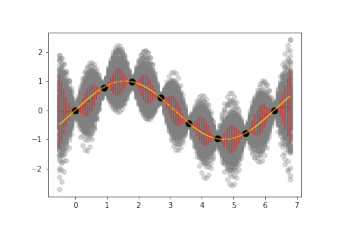

In [10]:

pl = plt.imread('/kaggle/working/part8_1.png')
plt.imshow(pl)
plt.axis('off')
plt.show()

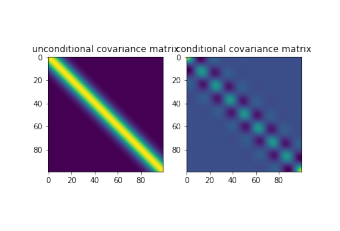

In [11]:

pl = plt.imread('/kaggle/working/part8_2.png')
plt.imshow(pl)
plt.axis('off')
plt.show()